This code was build to train a model that can predict the price of a home on Switzerland. The model will later be applied into a website.

Group: Adrian Widmer, Ludimila Hitzinicolau, Victor Guerra, Icaro Canela

# Toblehome

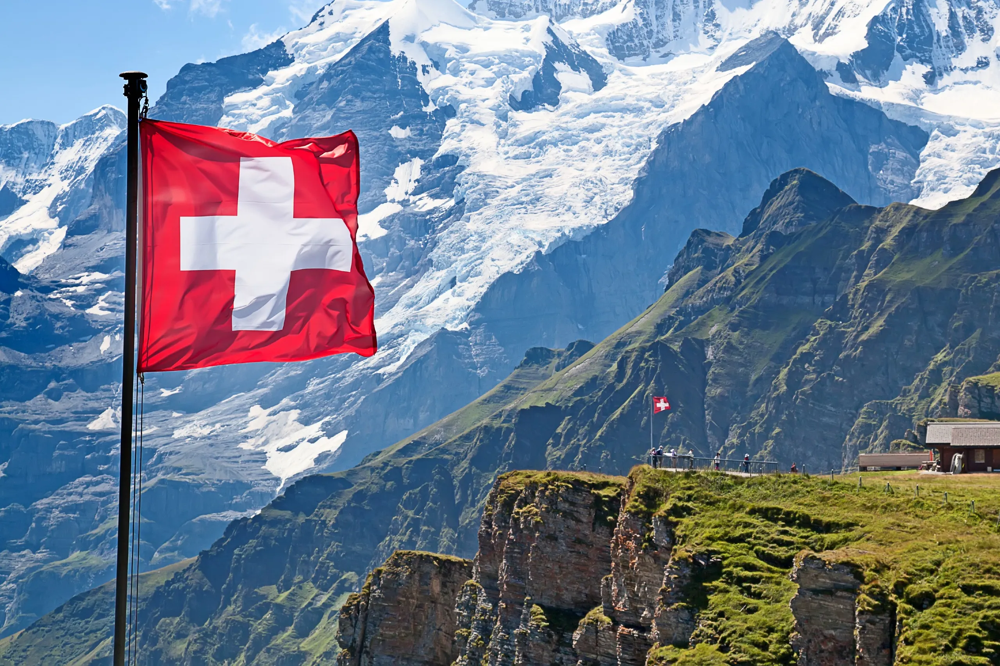

## Imports

In [10]:
# Importando as bibliotecas necessárias
import pandas as pd
import numpy as np

from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler

import matplotlib.pyplot as plt
import seaborn as sns

## Data Treatment

In [11]:
# Load Data
data = pd.read_csv("..\Training_Model\Switzerland Database\house_prices_switzerland.csv")

# Removendo as colunas 'ID' e 'Locality'
remove = ['ID', 'Locality']
data_treated = data.drop(remove, axis=1)

# Convertendo valores booleanos para 1 e 0
data_treated['Balcony'] = data_treated['Balcony'].replace({True: 1, False: 0})
data_treated = data_treated.dropna(subset=['Price'])

data_treated

C:\Users\Awi-T300\AppData\Local\Temp\ipykernel_32684\3177954907.py:9: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  data_treated['Balcony'] = data_treated['Balcony'].replace({True: 1, False: 0})


,HouseType,Size,Price,LotSize,Balcony,LivingSpace,NumberRooms,YearBuilt,PostalCode
0,SINGLE_HOUSE,L,1249500.0,NaN,1.0,270.0,7.5,NaN,6852
1,VILLA,M,1389150.0,640.0,1.0,230.0,8.5,2024.0,1963
5,SINGLE_HOUSE,S,1102500.0,460.0,1.0,190.0,7.5,NaN,2855
6,SINGLE_HOUSE,L,1462650.0,NaN,1.0,250.0,7.5,NaN,6828
7,MULTIPLE_DWELLING,L,1765220.0,NaN,1.0,280.0,NaN,2023.0,6855
...,...,...,...,...,...,...,...,...,...
968,SINGLE_HOUSE,L,1609650.0,734.0,NaN,230.0,8.5,1996.0,1530
969,SINGLE_HOUSE,L,1014300.0,601.0,NaN,250.0,11.0,1903.0,2400
970,BIFAMILIAR_HOUSE,L,2050650.0,554.0,1.0,240.0,7.5,2023.0,1080
971,SINGLE_HOUSE,L,2587200.0,NaN,NaN,510.0,12.5,1993.0,6833


### Plot

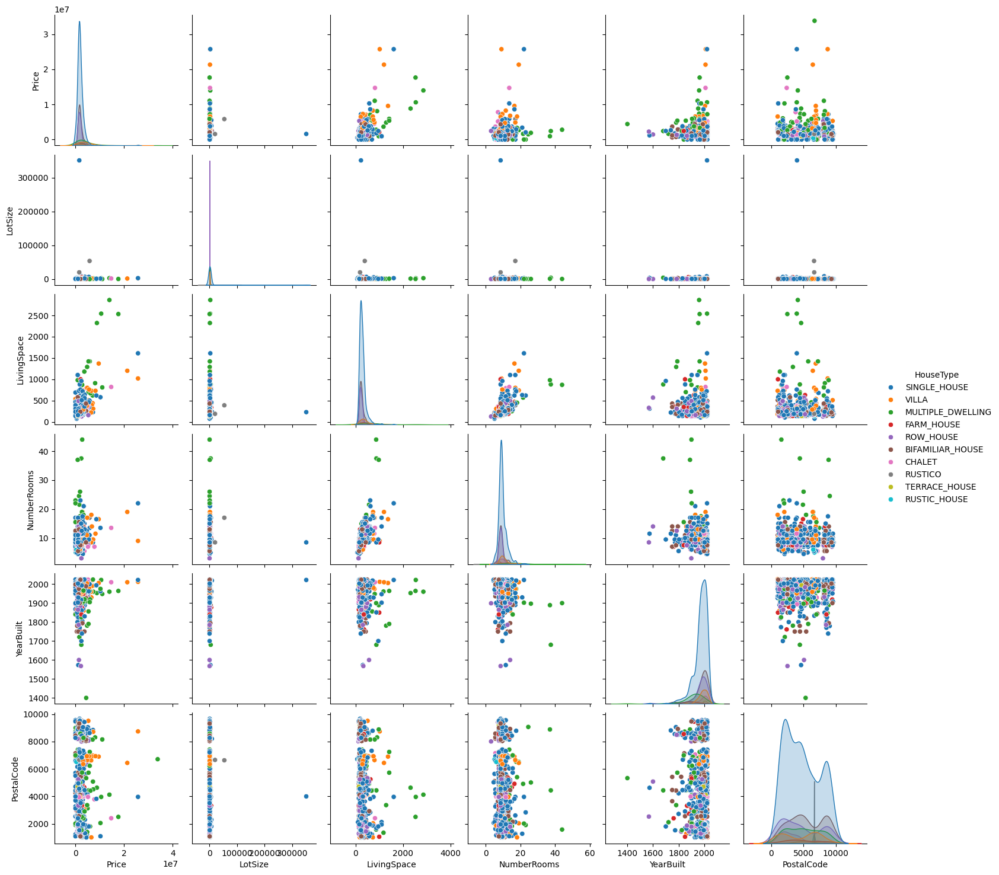

In [12]:
numeric_columns = ['Price', 'LotSize', 'LivingSpace', 'NumberRooms', 'YearBuilt', 'PostalCode']
# Plotar o pairplot
sns.pairplot(data_treated[numeric_columns + ['HouseType']], hue='HouseType')
plt.show()

### Final Dataset

In [13]:
data_treated

,HouseType,Size,Price,LotSize,Balcony,LivingSpace,NumberRooms,YearBuilt,PostalCode
0,SINGLE_HOUSE,L,1249500.0,NaN,1.0,270.0,7.5,NaN,6852
1,VILLA,M,1389150.0,640.0,1.0,230.0,8.5,2024.0,1963
5,SINGLE_HOUSE,S,1102500.0,460.0,1.0,190.0,7.5,NaN,2855
6,SINGLE_HOUSE,L,1462650.0,NaN,1.0,250.0,7.5,NaN,6828
7,MULTIPLE_DWELLING,L,1765220.0,NaN,1.0,280.0,NaN,2023.0,6855
...,...,...,...,...,...,...,...,...,...
968,SINGLE_HOUSE,L,1609650.0,734.0,NaN,230.0,8.5,1996.0,1530
969,SINGLE_HOUSE,L,1014300.0,601.0,NaN,250.0,11.0,1903.0,2400
970,BIFAMILIAR_HOUSE,L,2050650.0,554.0,1.0,240.0,7.5,2023.0,1080
971,SINGLE_HOUSE,L,2587200.0,NaN,NaN,510.0,12.5,1993.0,6833


# Training Using K-Nearest Neighbors

In [14]:
# Dividir o DataFrame em features (X) e target (y)
from sklearn.neighbors import KNeighborsRegressor


X = data_treated.drop(columns=['Price'])
y = data_treated['Price']

# Dividir os dados em conjuntos de treinamento e teste
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.4, random_state=50)

# Definir colunas categóricas e numéricas
categorical_columns = ['HouseType', 'Size']
numeric_columns = ['LotSize', 'Balcony', 'LivingSpace', 'NumberRooms', 'YearBuilt', 'PostalCode']

# Definir pré-processador com normalização para as colunas numéricas
preprocessor = ColumnTransformer(
    transformers=[
        ('num', Pipeline(steps=[
            ('imputer', SimpleImputer(strategy='mean')),
            ('scaler', StandardScaler())  # Normalização
        ]), numeric_columns),
        ('cat', Pipeline(steps=[
            ('imputer', SimpleImputer(strategy='constant', fill_value='missing')),
            ('onehot', OneHotEncoder(handle_unknown='ignore'))
        ]), categorical_columns)
    ])

# Definir modelo KNN
model = Pipeline([
    ('preprocessor', preprocessor),
    ('regressor', KNeighborsRegressor(n_neighbors=5))  # Definindo K=5
])

# Treinar o modelo
model.fit(X_train, y_train)

# Fazer previsões no conjunto de teste
y_pred = model.predict(X_test)

# Avaliar o modelo
mse = mean_squared_error(y_test, y_pred)
print(f'Mean Squared Error: {mse}')

Mean Squared Error: 2029809654238.989


### Gráfico Predição x Valor Real

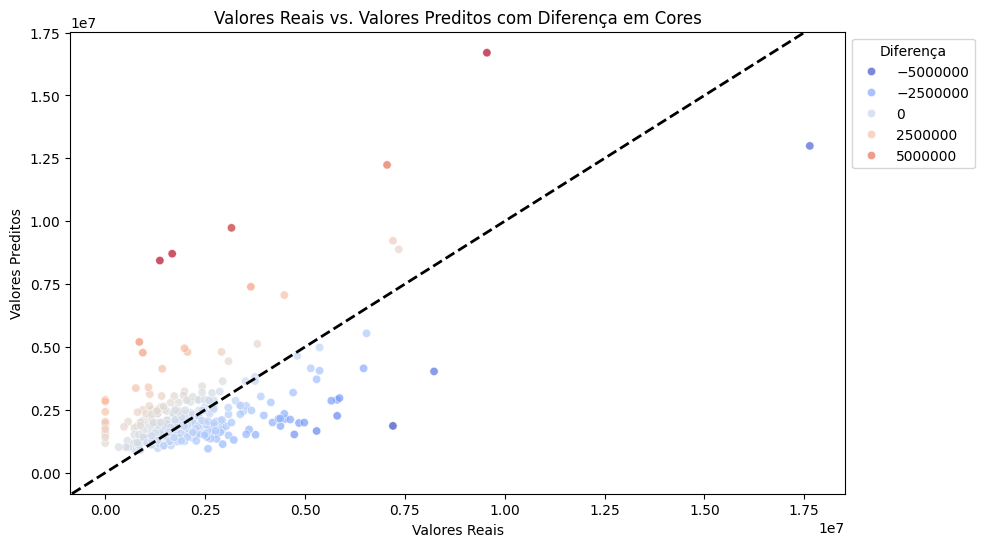

In [15]:
import matplotlib.pyplot as plt
import seaborn as sns

# Criar DataFrame com valores reais e previstos
results = pd.DataFrame({'Real': y_test, 'Previsto': y_pred})

# Calcular diferença entre valores reais e previstos
results['Diferença'] = results['Previsto'] - results['Real']

# Plotar gráfico de dispersão com paleta de cores
plt.figure(figsize=(10, 6))
sns.scatterplot(data=results, x='Real', y='Previsto', hue='Diferença', palette='coolwarm', alpha=0.7)
plt.xlabel('Valores Reais')
plt.ylabel('Valores Preditos')
plt.title('Valores Reais vs. Valores Preditos com Diferença em Cores')
plt.axline((0, 0), slope=1, color='black', linestyle='--', linewidth=2)  # Adiciona linha de referência
plt.legend(title='Diferença', loc='upper left', bbox_to_anchor=(1, 1))
plt.show()


# Training Using Linear Regression

In [16]:
# Dividir o DataFrame em features (X) e target (y)
from sklearn.linear_model import LinearRegression


X = data_treated.drop(columns=['Price'])
y = data_treated['Price']

# Dividir os dados em conjuntos de treinamento e teste
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Definir colunas categóricas e numéricas
categorical_columns = ['HouseType', 'Size']
numeric_columns = ['LotSize', 'Balcony', 'LivingSpace', 'NumberRooms', 'YearBuilt', 'PostalCode']

# Definir pré-processador com normalização para as colunas numéricas
preprocessor = ColumnTransformer(
    transformers=[
        ('num', Pipeline(steps=[
            ('imputer', SimpleImputer(strategy='mean')),
            ('scaler', StandardScaler())  # Normalização
        ]), numeric_columns),
        ('cat', Pipeline(steps=[
            ('imputer', SimpleImputer(strategy='constant', fill_value='missing')),
            ('onehot', OneHotEncoder(handle_unknown='ignore'))
        ]), categorical_columns)
    ])

# Definir modelo de regressão linear
model = Pipeline([
    ('preprocessor', preprocessor),
    ('regressor', LinearRegression())  
])

# Treinar o modelo
model.fit(X_train, y_train)

# Fazer previsões no conjunto de teste
y_pred = model.predict(X_test)

# Avaliar o modelo
mse = mean_squared_error(y_test, y_pred)

print(f'Mean Squared Error (MSE): {mse}')


Mean Squared Error (MSE): 25639268394657.32


### Gráfico Predição x Valor Real

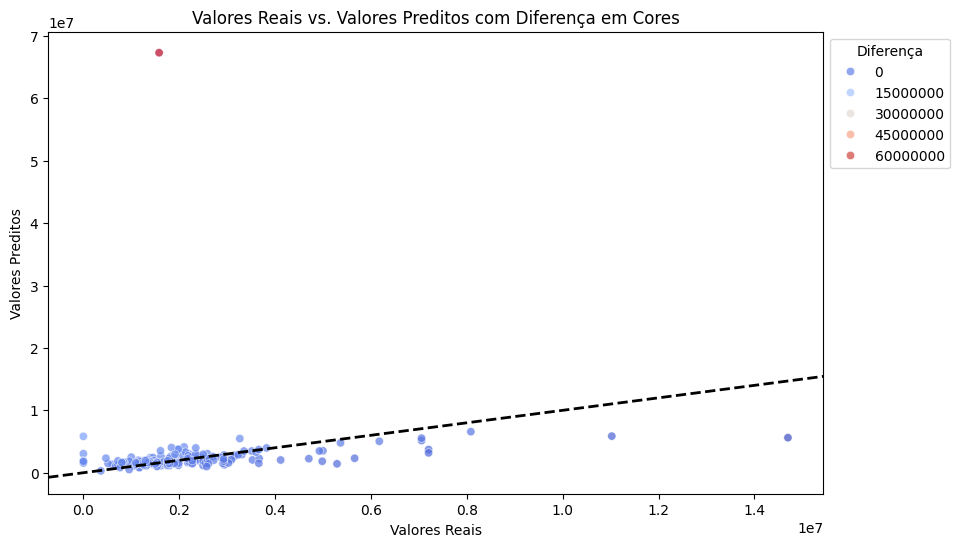

In [17]:
import matplotlib.pyplot as plt
import seaborn as sns

# Criar DataFrame com valores reais e previstos
results = pd.DataFrame({'Real': y_test, 'Previsto': y_pred})

# Calcular diferença entre valores reais e previstos
results['Diferença'] = results['Previsto'] - results['Real']

# Plotar gráfico de dispersão com paleta de cores
plt.figure(figsize=(10, 6))
sns.scatterplot(data=results, x='Real', y='Previsto', hue='Diferença', palette='coolwarm', alpha=0.7)
plt.xlabel('Valores Reais')
plt.ylabel('Valores Preditos')
plt.title('Valores Reais vs. Valores Preditos com Diferença em Cores')
plt.axline((0, 0), slope=1, color='black', linestyle='--', linewidth=2)  # Adiciona linha de referência
plt.legend(title='Diferença', loc='upper left', bbox_to_anchor=(1, 1))
plt.show()


# Training Using Robust Regression Model (Huber's Regression)

In [18]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.linear_model import HuberRegressor
from sklearn.metrics import mean_squared_error


# Dividir o DataFrame em features (X) e target (y)
X = data_treated.drop(columns=['Price'])
y = data_treated['Price']

# Dividir os dados em conjuntos de treinamento e teste
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.7, random_state=42)

# Definir colunas categóricas e numéricas
categorical_columns = ['HouseType', 'Size']
numeric_columns = ['LotSize', 'Balcony', 'LivingSpace', 'NumberRooms', 'YearBuilt', 'PostalCode']

# Definir pré-processador com normalização para as colunas numéricas
preprocessor = ColumnTransformer(
    transformers=[
        ('num', Pipeline(steps=[
            ('imputer', SimpleImputer(strategy='mean')),
            ('scaler', StandardScaler())  # Normalização
        ]), numeric_columns),
        ('cat', Pipeline(steps=[
            ('imputer', SimpleImputer(strategy='constant', fill_value='missing')),
            ('onehot', OneHotEncoder(handle_unknown='ignore'))
        ]), categorical_columns)
    ])

# Definir modelo de regressão robusta - Regressão de Huber
model = Pipeline([
    ('preprocessor', preprocessor),
    ('regressor', HuberRegressor())
])

# Treinar o modelo
model.fit(X_train, y_train)

# Fazer previsões no conjunto de teste
y_pred = model.predict(X_test)

# Avaliar o modelo
mse = mean_squared_error(y_test, y_pred)
print(f'Mean Squared Error (MSE): {mse}')


Mean Squared Error (MSE): 17595431749269.168


### Gráfico Predição x Valor Real

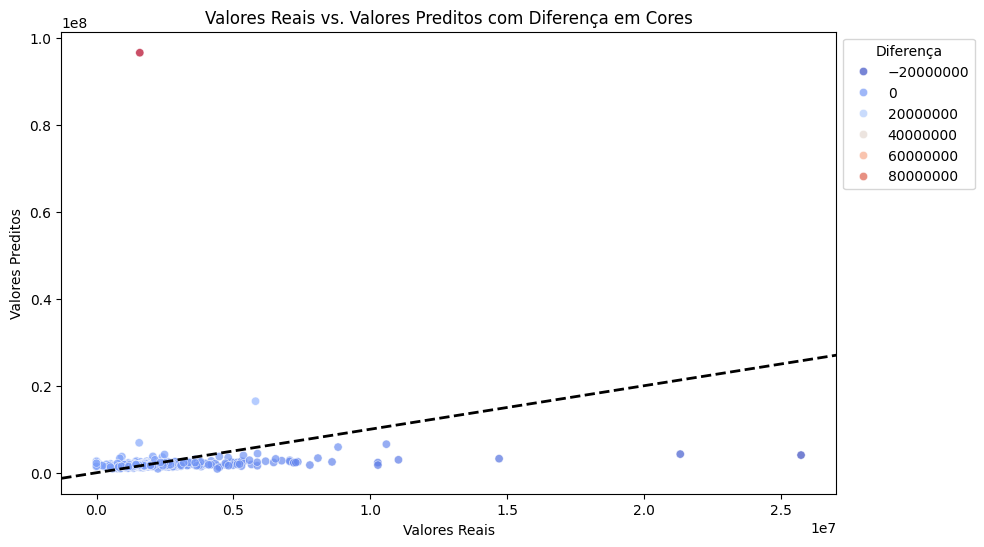

In [19]:
import matplotlib.pyplot as plt
import seaborn as sns

# Criar DataFrame com valores reais e previstos
results = pd.DataFrame({'Real': y_test, 'Previsto': y_pred})

# Calcular diferença entre valores reais e previstos
results['Diferença'] = results['Previsto'] - results['Real']

# Plotar gráfico de dispersão com paleta de cores
plt.figure(figsize=(10, 6))
sns.scatterplot(data=results, x='Real', y='Previsto', hue='Diferença', palette='coolwarm', alpha=0.7)
plt.xlabel('Valores Reais')
plt.ylabel('Valores Preditos')
plt.title('Valores Reais vs. Valores Preditos com Diferença em Cores')
plt.axline((0, 0), slope=1, color='black', linestyle='--', linewidth=2)  # Adiciona linha de referência
plt.legend(title='Diferença', loc='upper left', bbox_to_anchor=(1, 1))
plt.show()
